<a href="https://colab.research.google.com/github/anandaru/NIT/blob/main/CVision1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


# What are images

Images refer to digital representations of visual information, typically in the form of two-dimensional arrays of pixels. These images can be captured by various devices such as cameras, scanners, or generated synthetically.

# Types of Images

**Grayscale Images**: These images contain only shades of gray, typically represented as a single intensity value per pixel, ranging from 0 (black) to 255 (white).

**Color Images**: These images consist of multiple channels of information, typically representing the intensities of different color channels (e.g., Red, Green, Blue - RGB), allowing for representation of a wide range of colors.

**Depth Images**: Depth images contain depth information in addition to color or grayscale information, providing the distance from the camera to objects in the scene.

**Binary Images**: Binary images have only two pixel values, typically 0 and 1, representing foreground and background. These are commonly used in segmentation tasks.

**Multispectral and Hyperspectral Images**: These images contain information beyond the visible spectrum, capturing data across multiple wavelengths.

In [ ]:
# Import necessary libraries
import cv2
from google.colab.patches import cv2_imshow

# Define the path to the image
image_path = '/content/drive/MyDrive/FELV-cat.jpg'

# Read and Show image

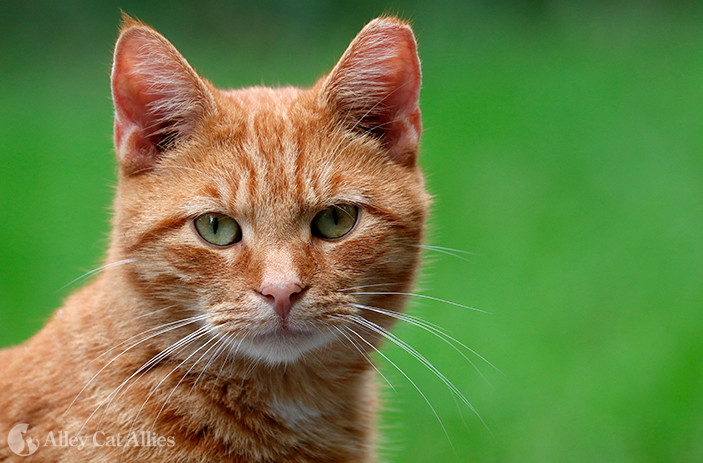

In [ ]:

# Read the image
image = cv2.imread(image_path)

# Check if the image is loaded successfully
cv2_imshow(image)

# What is Resolution
It is the level of detail or clarity of an image. It is typically measured in terms of the number of pixels that make up the image, often expressed as width × height (e.g., 1920 × 1080 pixels for a Full HD image).

In [ ]:
#image stored as numpy array
print(type(image))


<class 'numpy.ndarray'>


In [ ]:
#image stored in 3D Matrix x,y,color channel
print(image)

[[[ 39  69  34]
  [ 38  69  32]
  [ 37  68  31]
  ...
  [ 39  90  40]
  [ 41  91  43]
  [ 43  93  45]]

 [[ 35  66  27]
  [ 35  66  27]
  [ 35  66  27]
  ...
  [ 41  92  42]
  [ 41  92  42]
  [ 42  93  43]]

 [[ 36  67  28]
  [ 37  68  29]
  [ 37  68  29]
  ...
  [ 42  93  43]
  [ 42  93  43]
  [ 42  94  41]]

 ...

 [[ 14  53 122]
  [  9  48 116]
  [ 12  50 115]
  ...
  [ 50 138  72]
  [ 47 138  69]
  [ 47 139  68]]

 [[ 37  75 139]
  [ 37  75 139]
  [ 45  82 142]
  ...
  [ 48 136  70]
  [ 48 136  70]
  [ 48 137  68]]

 [[ 62 100 158]
  [ 66 103 159]
  [ 73 110 166]
  ...
  [ 48 134  70]
  [ 48 135  69]
  [ 48 135  69]]]


In [ ]:
# Get the dimensions of the image
height, width, channels = image.shape

# Print the size of the image
print("Image width:", width)
print("Image height:", height)
print("Number of channels:", channels)

Image width: 703
Image height: 463
Number of channels: 3


# Convert to Grayscale

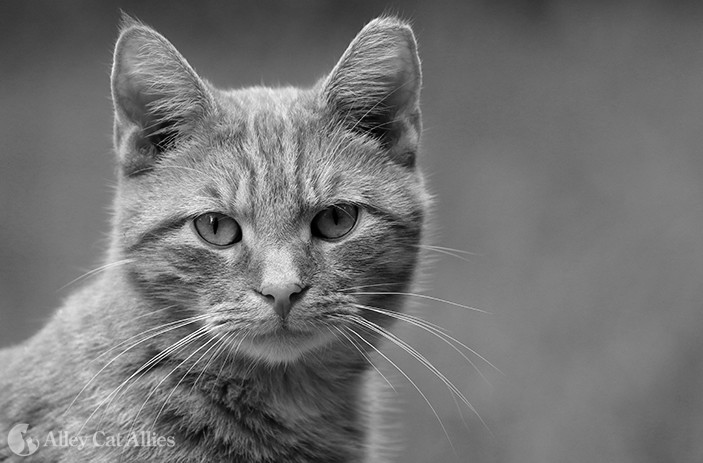

In [ ]:
img_gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
cv2_imshow(img_gray)

# Convert to HLS

HLS Color Space: HLS is another color space commonly used in image processing. It represents colors based on three components: Hue, Lightness, and Saturation.

Hue (H): Describes the color itself, represented as an angle on a color wheel (e.g., red, green, blue).
Lightness (L): Represents the brightness of the color.
Saturation (S): Indicates the intensity or purity of the color.

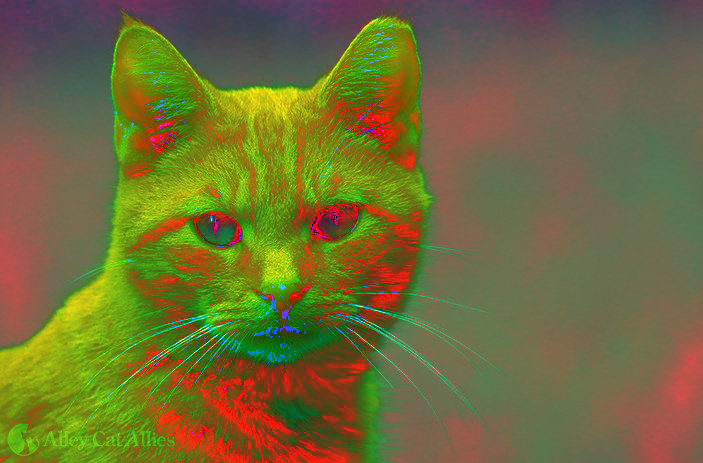

In [ ]:
img1 = cv2.cvtColor(image,cv2.COLOR_BGR2HLS_FULL)
cv2_imshow(img1)

# convert to YCR

YCrCb Color Space: YCrCb (also written as YCC or YCbCr) is a color space that separates the image into three components: Y (luma or brightness), Cr (chrominance red), and Cb (chrominance blue).

Y (Luma): Represents the brightness of the image, often referred to as the luminance component.
Cr (Chrominance Red): Describes the red-difference chrominance component.
Cb (Chrominance Blue): Describes the blue-difference chrominance component.

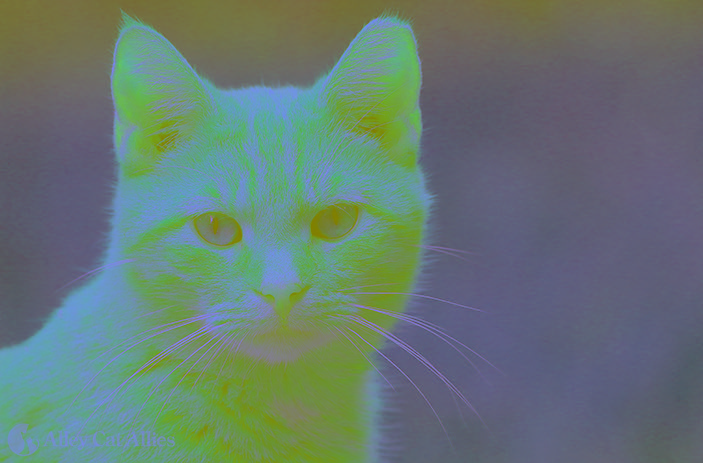

In [ ]:
img1 = cv2.cvtColor(image,cv2.COLOR_BGR2YCR_CB)
cv2_imshow(img1)

# Remove Green channel

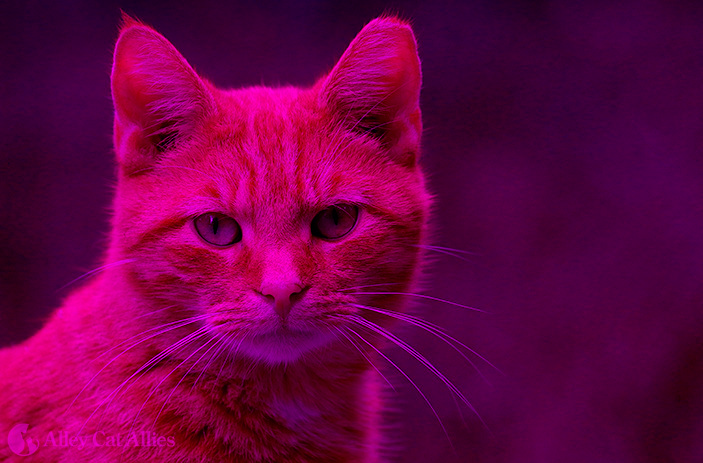

In [ ]:
img_BR = image.copy()
img_BR[:,:,1]=0
cv2_imshow(img_BR)

# Remove Red channel

Since OpenCV typically represents images in the BGR (Blue-Green-Red) color space, the third channel represents the red channel. Here, setting the values of the red channel to 0 for all pixels effectively removes the red color from the image.

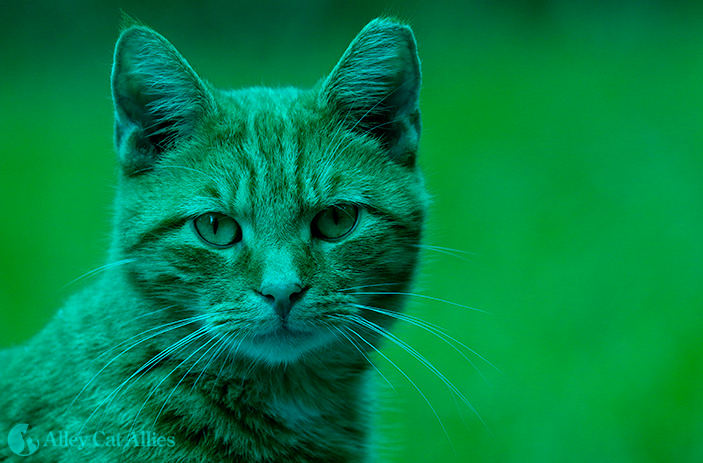

In [ ]:
img_BG = image.copy()
img_BG[:,:,2]=0
cv2_imshow(img_BG)

# Remove blue channel

In NumPy array indexing, the syntax array[:,:,0] selects all rows and columns of the array but only the first (0-indexed) channel. Here, it sets the values of the first channel (usually the blue channel in a BGR image) to 0 for all pixels. This effectively removes the blue channel from the image, leaving it with only the green and red channels.

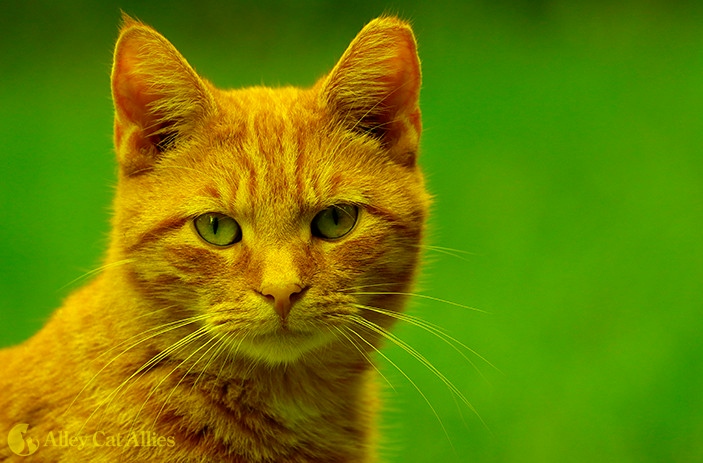

In [ ]:
img_GR = image.copy()
img_GR[:,:,0]=0
cv2_imshow(img_GR)

# Display stacked

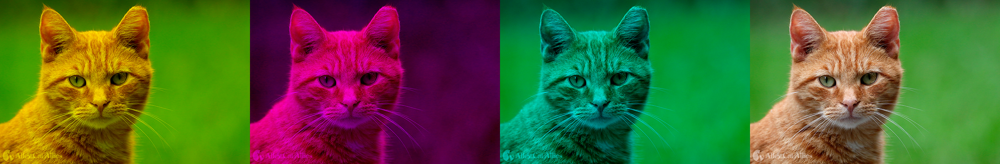

In [ ]:
import numpy as np

image_stacked= np.hstack((img_GR,img_BR,img_BG,image))
cv2_imshow(image_stacked)

# Resize Image

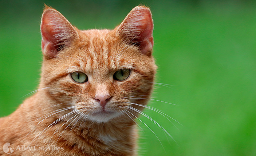

In [ ]:
#cv2_imshow(image)
img_resize = cv2.resize(image,(256,156))
cv2_imshow(img_resize)

In [ ]:
print(img_resize.shape)

(156, 256, 3)


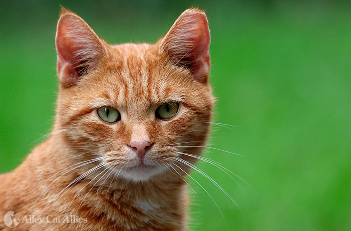

In [ ]:
#resize to half
img_resize1 = cv2.resize(image,(image.shape[1]//2,image.shape[0]//2))
cv2_imshow(img_resize1)

In [ ]:
print(image.shape)
print(img_resize1.shape)

(463, 703, 3)
(231, 351, 3)


# Flip the image

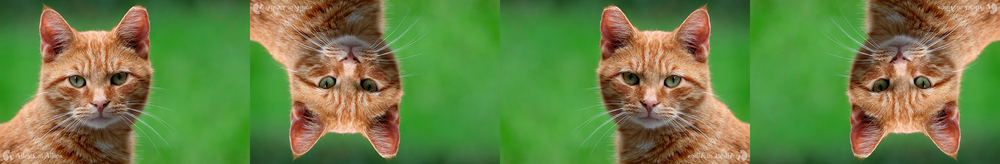

In [ ]:

img_flip_0 = cv2.flip(image,0) # vertical flip - on x axis
img_flip_1 = cv2.flip(image,1) # horizontal flip - on y axis
img_flip_m1 = cv2.flip(image,-1) # both x and y axis flip
image_stacked1= np.hstack((image,img_flip_0,img_flip_1,img_flip_m1))
cv2_imshow(image_stacked1)

# Crop image

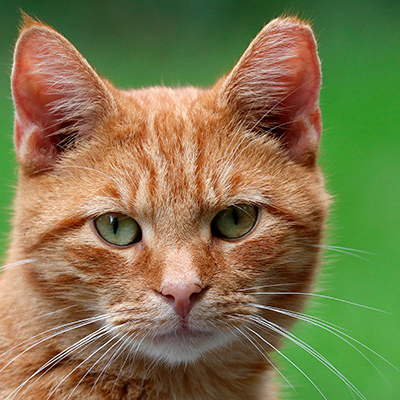

In [ ]:
img_crop = image[0:400,100:500]
cv2_imshow(img_crop)

# Save file

In [ ]:
cv2.imwrite('cat_small.png',img_crop)

True

# Drawing Shapes

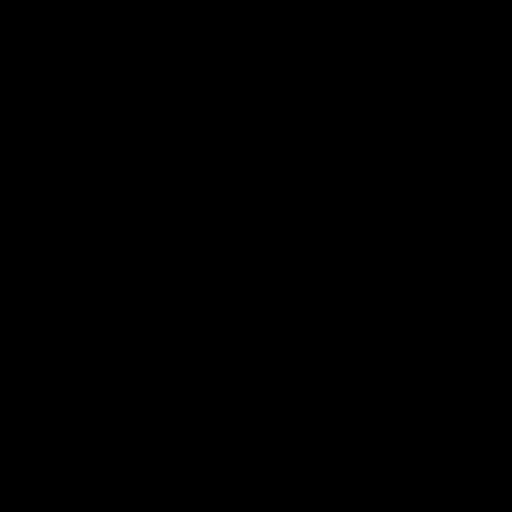

In [ ]:
img = np.zeros((512,512,3))
cv2_imshow(img)

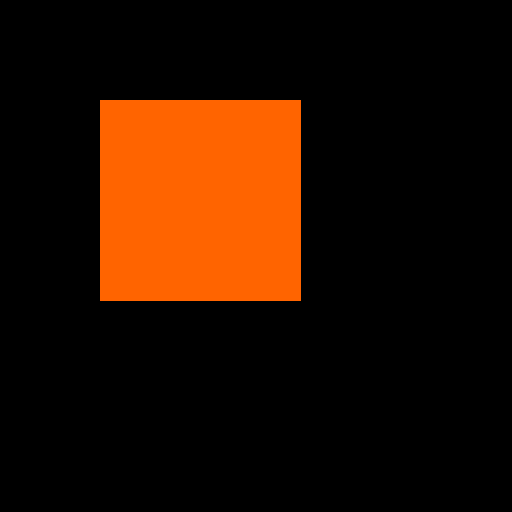

In [ ]:
cv2.rectangle(img,pt1=(100,100),pt2 = (300,300),color = (0,100,255),thickness = -1)
cv2_imshow(img)

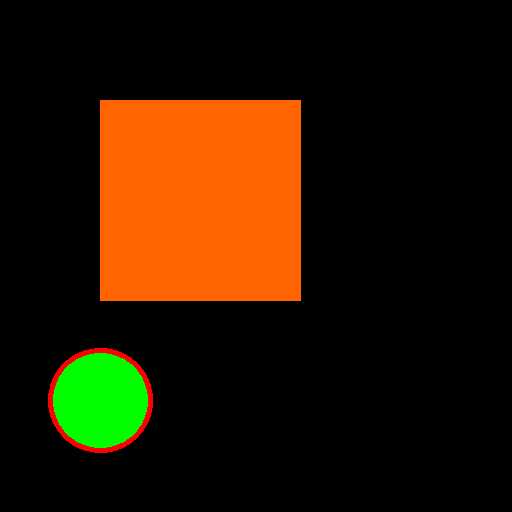

In [ ]:
cv2.circle(img,center = (100,400),radius =50, color = (0,255,0),thickness = -1)
cv2.circle(img,center = (100,400),radius =50, color = (0,0,255),thickness = 3)
cv2_imshow(img)

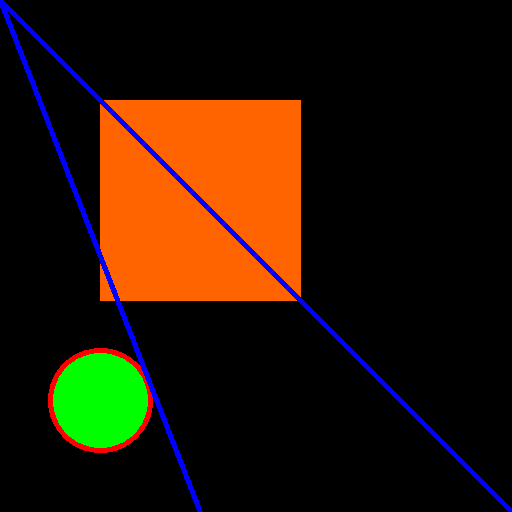

In [ ]:
cv2.line(img,pt1=(0,0),pt2 = (512,512),thickness= 3 , color = (255,0,0))
cv2_imshow(img)

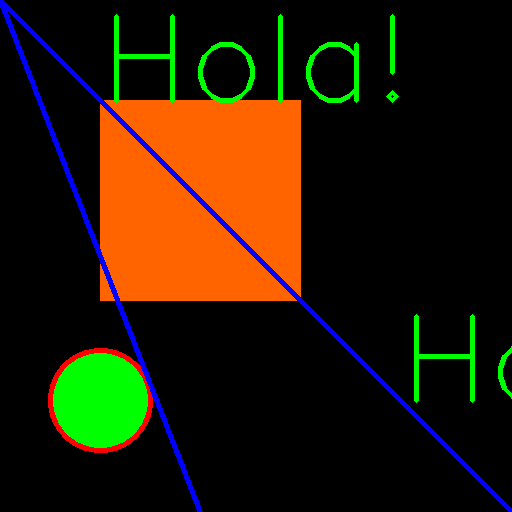

In [ ]:
cv2.putText(img,org=(100,100),fontScale=4,color=(0,255,0),thickness=4,lineType = cv2.LINE_AA,text = 'Hola!',fontFace=cv2.FONT_ITALIC)
cv2_imshow(img)

# Problem

generate 256*256 image.

*   value of each pixel in the ith row of the red channel is i*0.0039
*   value of each pixel in the ith row of the green channel is (1 - i*0.0039)
*   every pixel in the blue channel is 1





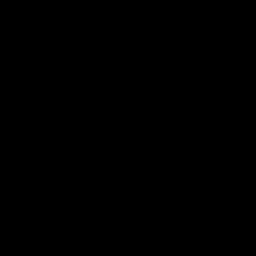

In [ ]:
import numpy as np
img = np.zeros((256,256,3))
cv2_imshow(img)

# For loop

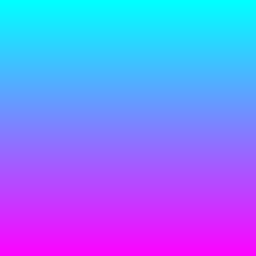

In [ ]:
height, width, channel = img.shape

# Iterate over the indices of the array
for i in range(height):
        img[i,:,2] = int(i * 0.0039 * 255)
        img[i,:,1] = 255 - int(i * 0.0039 * 255)
        img[i,:,0] = 255

cv2_imshow(img)

# Vectorized code

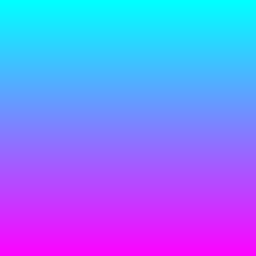

In [ ]:
# Assuming img is your original image
height, width, channel = img.shape

# Create indices for the meshgrid
row_indices, col_indices, ch_indices = np.meshgrid(np.arange(height), np.arange(width), np.arange(channel), indexing='ij')

# Create mask for the red channel
red_mask = (ch_indices == 2)

# Apply the conditions using vectorized operations
img[red_mask] = (row_indices[red_mask] * 0.0039 * 255).astype(int)

img[~red_mask] = 255

# Invert green channel
green_mask = (ch_indices == 1)
img[green_mask] = 255 - (row_indices[green_mask] * 0.0039 * 255).astype(int)

cv2_imshow(img)
